In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import sys
import warnings
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Dropout, ConvLSTM2D, Flatten, Conv2D, TimeDistributed, Reshape, Bidirectional, Input, Attention, Concatenate, BatchNormalization
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax, Adam
import seaborn as sns
import matplotlib.patches as mpatches
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import TensorBoard
from pathlib import Path
from typing import List, Tuple, Union,Dict
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.losses import CategoricalCrossentropy
from datetime import datetime


%matplotlib inline


warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [3]:
dataset_path = '/content/drive/My Drive/beeth/'

In [ ]:
# Loading Data

class MidiDataLoader:
    """Class to load and process MIDI files."""

    def __init__(self, dataset_path: str):
        """
        Initializes the data loader with the path to the dataset.

        Args:
            dataset_path (str): The file path to the folder containing MIDI files.
        """
        self.dataset_path = Path(dataset_path)
        self._check_dataset_path_exists()

    def _check_dataset_path_exists(self):
        """Check if the dataset path exists and raise FileNotFoundError if not."""
        if not self.dataset_path.exists():
            raise FileNotFoundError(f"The specified path {self.dataset_path} does not exist.")

    def load_midi_files(self) -> List[stream.Stream]:
        """Load and parse MIDI files into music21 streams.

        Returns:
            List of music21.stream.Stream: A list of parsed MIDI streams.
        """
        all_midis = []
        for file_name in self.dataset_path.glob("*.mid"):
            try:
                all_midis.append(converter.parse(file_name))
            except Exception as e:
                print(f"Failed to parse {file_name}: {e}")
        return all_midis

    def extract_notes(self, all_midis: List[stream.Stream]) -> List[str]:
        """Extract notes and chords from the MIDI files.

        Args:
            all_midis (List of stream.Stream): List of MIDI streams.

        Returns:
            List[str]: A list of notes and chords represented as strings.
        """
        notes = []
        for midi in all_midis:
            notes.extend(self._process_midi(midi))
        return notes

    def _process_midi(self, midi: stream.Stream) -> List[str]:
        """Process a single midi file to extract notes or chords."""
        notes = []
        try:
            songs = instrument.partitionByInstrument(midi)
            if songs:  # Instrument parts are separated
                for part in songs.parts:
                    notes.extend(self._extract_from_stream(part.recurse()))
            else:  # No separate parts
                notes.extend(self._extract_from_stream(midi.flat.notes))
        except Exception as e:
            print(f"Error processing MIDI: {e}")
        return notes

    def _extract_from_stream(self, elements: stream.Stream) -> List[str]:
        """Extract notes or chords from a stream of elements."""
        return [self._note_or_chord_to_text(element) for element in elements if isinstance(element, (note.Note, chord.Chord))]

    def _note_or_chord_to_text(self, element) -> str:
        """Convert a note or chord element to text representation."""
        if isinstance(element, note.Note):
            return str(element.pitch)
        elif isinstance(element, chord.Chord):
            return '.'.join(str(n) for n in element.normalOrder)



In [ ]:

# Initialize the data loader
loader = MidiDataLoader(dataset_path)

# Load MIDI files
all_midis = loader.load_midi_files()

# Extract notes from MIDI files
notes = loader.extract_notes(all_midis)

print("Total notes in all the Beethoven midis in the dataset:", len(notes))


Total notes in all the Beethoven midis in the dataset: 81313


# Exploring and analyzing data

In [ ]:
# Convert notes and chords to music21 streams

class MusicStreamCreator:
    """Class to convert notes and chords into music21 streams."""

    def __init__(self):
        """Initializes the MusicStreamCreator."""
        pass

    def chords_n_notes(self, snippet):
        """Converts a list of notes and chords to a music21 stream.

        Args:
            snippet (list of str): List of notes and chord representations.

        Returns:
            music21.stream.Stream: A music21 stream containing the notes and chords.
        """
        melody = []
        offset = 0  # Incremental offset to ensure notes do not stack
        for item in snippet:
            if "." in item or item.isdigit():
                chord_notes = item.split(".")
                notes = [note.Note(int(n)) for n in chord_notes]
                new_chord = chord.Chord(notes)
                new_chord.offset = offset
                melody.append(new_chord)
            else:
                new_note = note.Note(item)
                new_note.offset = offset
                melody.append(new_note)
            offset += 1
        return stream.Stream(melody)


In [ ]:

class CorpusAnalyzer:
    """Class to analyze and plot the distribution of notes in a corpus."""

    def __init__(self, corpus):
        """Initializes the CorpusAnalyzer with a corpus.

        Args:
            corpus (list of str): The corpus containing notes and chords.
        """
        self.corpus = corpus
        self.counts = Counter(self.corpus)

    def print_statistics(self):
        """Prints statistical information about the notes in the corpus."""
        print("Total unique notes in the Corpus:", len(self.counts))
        recurrences = list(self.counts.values())
        average = sum(recurrences) / len(recurrences)
        print("Average recurrence for a note in Corpus:", average)
        print("Most frequent note in Corpus appeared:", max(recurrences), "times")
        print("Least frequent note in Corpus appeared:", min(recurrences), "time")

    def plot_note_distribution(self):
        """Plots the distribution of note frequencies in the corpus using a histogram with KDE."""
        recurrences = list(self.counts.values())

        plt.figure(figsize=(12, 6))
        sns.set(style="whitegrid")
        sns.histplot(recurrences, kde=True, color="skyblue", bins=30, line_kws={'linewidth': 3})
        plt.title('Frequency Distribution of Notes in the Corpus')
        plt.xlabel('Frequency of Occurrence')
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()

    def filter_rare_notes(self, threshold=100):
        """Removes rare notes from the corpus based on a frequency threshold.

        Args:
            threshold (int): The frequency threshold below which notes are considered rare.

        Returns:
            int: The length of the corpus after filtering.
        """
        rare_notes = {note for note, count in self.counts.items() if count < threshold}
        self.corpus = [note for note in self.corpus if note not in rare_notes]
        return len(self.corpus)


In [ ]:

loader = MusicStreamCreator()
midiloader = MidiDataLoader(dataset_path)
Corpus= midiloader.extract_notes(all_midis)
melody_snippet = loader.chords_n_notes(Corpus[:1000])
melody_snippet.write('midi', fp='/content/melody.mid')



'/content/melody.mid'

In [ ]:
from IPython.display import Audio
Audio('/content/melody.wav')

Total unique notes in the Corpus: 349
Average recurrence for a note in Corpus: 232.98853868194843
Most frequent note in Corpus appeared: 2094 times
Least frequent note in Corpus appeared: 1 time


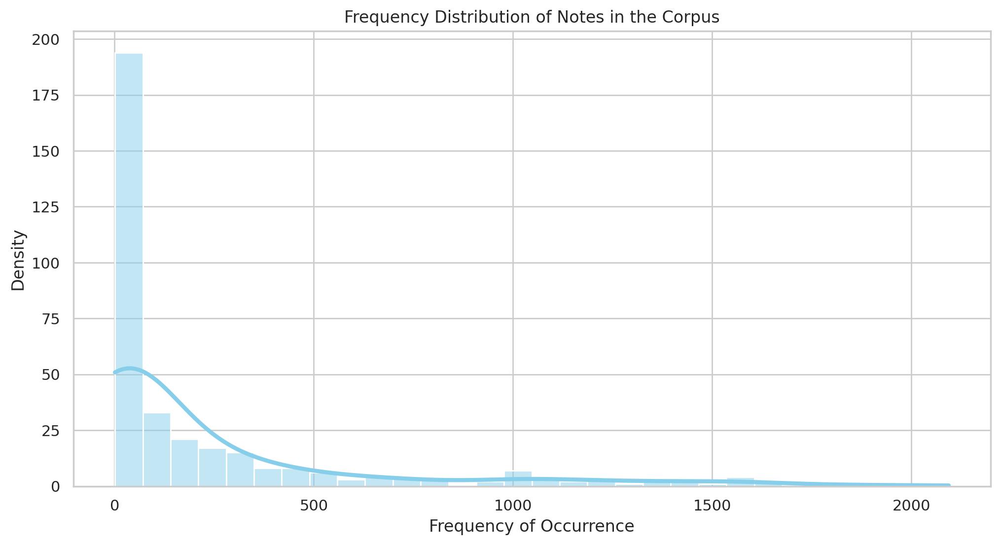

Length of Corpus after elimination of rare notes: 76913


In [ ]:
analyzer = CorpusAnalyzer(Corpus)
analyzer.print_statistics()
analyzer.plot_note_distribution()
new_corpus_length = analyzer.filter_rare_notes()
print("Length of Corpus after elimination of rare notes:", new_corpus_length)

# Data preproccessing

In [ ]:
# data preproccissing

class DataPreprocessor:
    """
    A class to handle preprocessing of corpus data for sequence modeling.

    Attributes:
        corpus (list of str): The raw corpus containing all notes and chords.
        sequence_length (int): The length of the input sequences for the model.
    """

    def __init__(self, corpus, sequence_length=40):
        """
        Initializes the DataPreprocessor with a corpus and sequence length.

        Args:
            corpus (list of str): The raw corpus data.
            sequence_length (int): The length of sequences to be generated.
        """
        self.corpus = corpus
        self.sequence_length = sequence_length
        self.mapping = {}
        self.reverse_mapping = {}
        self.features = []
        self.targets = []

    def build_mappings(self):
        """
        Creates mappings from characters to indices and vice versa.
        """
        symb = sorted(list(set(self.corpus)))
        self.mapping = {c: i for i, c in enumerate(symb)}
        self.reverse_mapping = {i: c for i, c in enumerate(symb)}
        print(f"Number of unique characters: {len(symb)}")

    def encode_sequences(self):
        """
        Encodes the corpus into input and target sequences using previously built mappings.
        """
        for i in range(0, len(self.corpus) - self.sequence_length):
            feature = self.corpus[i:i + self.sequence_length]
            target = self.corpus[i + self.sequence_length]
            for char in feature:
                if char not in self.mapping:
                  print(f"Character not found in mapping: {char}")
            self.features.append([self.mapping[char] for char in feature])
            self.targets.append(self.mapping[target])
        print(f"Total number of sequences: {len(self.targets)}")

    def prepare_datasets(self, test_size=0.2, batch_size=256):
        """
        Prepares TensorFlow datasets for training and validation.

        Args:
            test_size (float): The proportion of the dataset to include in the test split.
            batch_size (int): Number of samples per batch of computation.

        Returns:
            Tuple[tf.data.Dataset, tf.data.Dataset]: Training and validation datasets.
        """
        X = np.array(self.features).reshape((-1, self.sequence_length, 1))
        X = X.astype(float)

        y = to_categorical(self.targets)
        X /= float(len(self.mapping))  # Normalize

        X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=test_size, random_state=42)

        # reshape for convolutions in LSTM if needed
        X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], 1, 1, X_train.shape[2]))
        X_seed = X_seed.reshape((X_seed.shape[0], X_seed.shape[1], 1, 1, X_seed.shape[2]))

        # Prepare datasets
        train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train)).batch(batch_size)
        validation_dataset = tf.data.Dataset.from_tensor_slices((X_seed, y_seed)).batch(batch_size)
        return train_dataset, validation_dataset, X_train, X_seed


In [ ]:
preprocessor = DataPreprocessor(Corpus, sequence_length=40)
preprocessor.build_mappings()
preprocessor.encode_sequences()
train_dataset, validation_dataset, X_train, X_seed = preprocessor.prepare_datasets()

print("Datasets prepared and ready for training.")

Number of unique characters: 349
Total number of sequences: 81273
Datasets prepared and ready for training.


# Model building

In [ ]:
# Model

class ModelBuilder:
    """
    Class responsible for constructing the TensorFlow model with ConvLSTM2D, Conv2D, LSTM, and Dense layers.
    """
    def __init__(self, input_shape, num_classes):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def build_model(self):
        """
        Constructs and compiles a multi-layer deep learning model.

        Returns:
            A compiled TensorFlow model.
        """
        DROPOUT_RATE = 0.3
        L2_REG = 0.001
        LEARNING_RATE = 0.01

        model_input = Input(shape=self.input_shape)

        # First ConvLSTM2D layer
        x = ConvLSTM2D(filters=64, kernel_size=(3, 3), return_sequences=True, padding='same', kernel_regularizer=l2(L2_REG))(model_input)
        x = BatchNormalization()(x)
        x = Dropout(DROPOUT_RATE)(x)

        # Second ConvLSTM2D layer
        x = ConvLSTM2D(filters=32, kernel_size=(3, 3), return_sequences=True, padding='same', kernel_regularizer=l2(L2_REG))(x)
        x = BatchNormalization()(x)
        x = Dropout(DROPOUT_RATE)(x)

        # TimeDistributed Conv2D layer
        x = TimeDistributed(Conv2D(filters=32, kernel_size=(3, 3), activation='relu', padding='same', kernel_regularizer=l2(L2_REG)))(x)
        x = TimeDistributed(Flatten())(x)

        # Bidirectional LSTM layer
        lstm_out = Bidirectional(LSTM(128, return_sequences=True, kernel_regularizer=l2(L2_REG)))(x)
        lstm_out = Dropout(DROPOUT_RATE)(lstm_out)

        # Attention Mechanism
        attention_out = Attention()([lstm_out, lstm_out])
        attention_out = Concatenate(axis=-1)([lstm_out, attention_out])

        # Dense output layer
        x = Flatten()(attention_out)
        x = Dense(256, activation='relu', kernel_regularizer=l2(L2_REG))(x)
        x = Dropout(DROPOUT_RATE)(x)
        model_output = Dense(self.num_classes, activation='softmax')(x)

        model = Model(inputs=model_input, outputs=model_output)
        model.compile(loss='categorical_crossentropy', optimizer=Adamax(learning_rate=LEARNING_RATE))


        return model


In [ ]:
# train

class ModelTrainer:
    """
    Class responsible for training and validating the TensorFlow model.
    """
    def __init__(self, model):
        self.model = model
        self.loss_object = tf.keras.losses.CategoricalCrossentropy()
        self.optimizer = tf.keras.optimizers.Adam()
        self.train_loss = tf.keras.metrics.Mean(name='train_loss')
        self.validation_loss = tf.keras.metrics.Mean(name='validation_loss')


    def train_model(self, train_dataset, validation_dataset, epochs=50):
        """
        Trains and validates the model.

        Args:
            train_dataset (tf.data.Dataset): Training dataset.
            validation_dataset (tf.data.Dataset): Validation dataset.
            epochs (int): Number of training epochs.

        Returns:
            A dictionary containing training and validation loss and accuracy history.
        """
        log_dir = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
        tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

        metrics_history = {'train_loss': [], 'validation_loss': []}

        for epoch in range(epochs):
            for inputs, targets in train_dataset:
                self.train_step(inputs, targets)
            for inputs, targets in validation_dataset:
                self.validation_step(inputs, targets)

            metrics_history['train_loss'].append(self.train_loss.result().numpy())
            metrics_history['validation_loss'].append(self.validation_loss.result().numpy())

            print(f'Epoch {epoch + 1}, '
                  f'Train Loss: {self.train_loss.result()}, '
                  f'Validation Loss: {self.validation_loss.result()}')

            # Reset the metrics at the end of each epoch
            self.train_loss.reset_states()
            self.validation_loss.reset_states()

        return metrics_history

    @tf.function
    def train_step(self, inputs, targets):
        with tf.GradientTape() as tape:
            predictions = self.model(inputs, training=True)
            loss = self.loss_object(targets, predictions)
        gradients = tape.gradient(loss, self.model.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.model.trainable_variables))
        self.train_loss(loss)

    @tf.function
    def validation_step(self, inputs, targets):
        predictions = self.model(inputs, training=False)
        v_loss = self.loss_object(targets, predictions)
        self.validation_loss(v_loss)


In [ ]:

midi_loader = MidiDataLoader(dataset_path)
all_midis = midi_loader.load_midi_files()
notes = midi_loader.extract_notes(all_midis)


sequence_length = 64
preprocessor = DataPreprocessor(notes, sequence_length=64)
preprocessor.build_mappings()
preprocessor.encode_sequences()
train_dataset, validation_dataset, X_train, X_seed = preprocessor.prepare_datasets()


Number of unique characters: 349
Total number of sequences: 81249


In [ ]:
input_shape = (sequence_length, 1, 1, 1)
num_classes = 349  # The number of unique notes/chords

# Create the model
model_builder = ModelBuilder(input_shape, num_classes=num_classes)
model = model_builder.build_model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 1, 1, 1)]        0         []                            
                                                                                                  
 conv_lstm2d (ConvLSTM2D)    (None, 64, 1, 1, 64)         150016    ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 64, 1, 1, 64)         256       ['conv_lstm2d[0][0]']         
 Normalization)                                                                                   
                                                                                                  
 dropout (Dropout)           (None, 64, 1, 1, 64)         0         ['batch_normalization[0][0

In [ ]:
# Initialize the ModelTrainer with the built model
model_trainer = ModelTrainer(model)
# Train the model
metrics_history = model_trainer.train_model(train_dataset, validation_dataset, epochs=50)


Epoch 1, Train Loss: 4.78065824508667, Validation Loss: 4.955117702484131
Epoch 2, Train Loss: 4.64286470413208, Validation Loss: 4.926755428314209
Epoch 3, Train Loss: 4.58941650390625, Validation Loss: 4.550914764404297
Epoch 4, Train Loss: 4.528484344482422, Validation Loss: 6.037988185882568
Epoch 5, Train Loss: 4.462026596069336, Validation Loss: 4.702373504638672
Epoch 6, Train Loss: 4.372167587280273, Validation Loss: 4.679265975952148
Epoch 7, Train Loss: 4.266993045806885, Validation Loss: 4.332818984985352
Epoch 8, Train Loss: 4.150946140289307, Validation Loss: 4.298809051513672
Epoch 9, Train Loss: 4.019435405731201, Validation Loss: 4.303652763366699
Epoch 10, Train Loss: 3.8802127838134766, Validation Loss: 4.318796157836914
Epoch 11, Train Loss: 3.7332310676574707, Validation Loss: 4.219075679779053
Epoch 12, Train Loss: 3.5671472549438477, Validation Loss: 4.059679985046387
Epoch 13, Train Loss: 3.3935484886169434, Validation Loss: 4.0312957763671875
Epoch 14, Train Los

In [ ]:
# Evaluate the model

class ModelEvaluator:
    """
    Class for evaluating and visualizing the performance of a trained machine learning model,
    focusing on loss metrics.
    """
    def __init__(self, history):
        """
        Initializes the ModelEvaluator with the training history.

        Args:
            history (dict): A dictionary containing 'train_loss' and 'validation_loss'
                            from model training.
        """
        self.history_df = pd.DataFrame(history)

    def plot_learning_curves(self):
        """Plots learning curves for loss."""
        plt.figure(figsize=(15, 4), facecolor="#97BACB")
        sns.lineplot(data=self.history_df[['train_loss', 'validation_loss']])
        plt.title("Learning Plot of Model for Loss")
        plt.ylabel("Loss")
        plt.xlabel("Epochs")
        plt.legend(['Train Loss', 'Validation Loss'])
        plt.show()



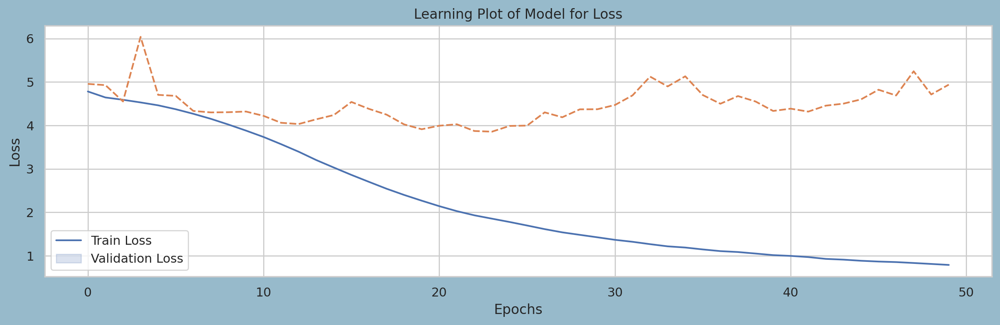

In [ ]:
evaluator = ModelEvaluator(metrics_history)
evaluator.plot_learning_curves()

In [ ]:
class MelodyGenerator:
    """
    Class for generating melodies using a trained model and temperature sampling.
    """
    def __init__(self, model, X_seed, reverse_mapping):
        """
        Initializes the MelodyGenerator.

        Args:
            model (Model): The trained Keras model.
            X_seed (np.array): Seed input for starting melody generation.
            reverse_mapping (dict): Mapping from indices back to notes/chords.
        """
        self.model = model
        self.X_seed = X_seed
        self.reverse_mapping = reverse_mapping

    def sample(self, preds, temperature=1.0):
        """
        Apply temperature sampling to model predictions to introduce randomness.

        Args:
            preds (array): Prediction output from the model.
            temperature (float): Factor to adjust the randomness of predictions.

        Returns:
            int: Chosen index based on the probability distribution adjusted by temperature.
        """
        preds = np.asarray(preds).astype('float64')
        preds = np.log(preds + 1e-7) / temperature  # Prevent division by zero
        exp_preds = np.exp(preds)
        preds = exp_preds / np.sum(exp_preds)
        probas = np.random.multinomial(1, preds, 1)
        return np.argmax(probas)

    def generate_melody(self, note_count, temperature=1.0):
        """
        Generates a melody from the model using the initial seed.

        Args:
            note_count (int): Number of notes/chords to generate.
            temperature (float): Sampling temperature for note generation.

        Returns:
            tuple: (List of generated notes/chords, music21.stream.Stream of the melody)
        """
        seed_index = np.random.randint(0, len(self.X_seed))
        seed = self.X_seed[seed_index:seed_index+1]
        notes_generated = []

        for _ in range(note_count):
            prediction = self.model.predict(seed, verbose=0)[0]
            index = self.sample(prediction, temperature)
            notes_generated.append(self.reverse_mapping[index])

            next_note = np.zeros((1, 1, 1, 1, 1))
            next_note[0, 0, 0, 0, 0] = index / float(len(self.reverse_mapping))
            seed = np.concatenate((seed[:, 1:, :, :, :], next_note), axis=1)

        return notes_generated, self.convert_to_music_stream(notes_generated)

    def convert_to_music_stream(self, notes):
        """
        Converts a list of note strings into a music21 stream.

        Args:
            notes (list of str): Notes and chords represented as strings.

        Returns:
            music21.stream.Stream: The music stream containing the notes and chords.
        """
        melody = []
        offset = 0
        for note_or_chord in notes:
            if '.' in note_or_chord or note_or_chord.isdigit():
                notes_in_chord = note_or_chord.split('.')
                chord_notes = [music21.note.Note(int(n)) for n in notes_in_chord]
                new_chord = music21.chord.Chord(chord_notes)
                new_chord.offset = offset
                melody.append(new_chord)
            else:
                new_note = music21.note.Note(note_or_chord)
                new_note.offset = offset
                melody.append(new_note)
            offset += 0.5  # Ensures notes and chords do not overlap

        return music21.stream.Stream(melody)




In [ ]:
generator = MelodyGenerator(model, X_seed, preprocessor.reverse_mapping)
notes, melody_stream = generator.generate_melody(100, temperature=1.0)
melody_stream.write('midi', fp='/content/Melody_Generated1.mid')

'/content/Melody_Generated1.mid'

In [ ]:
from IPython.display import Audio
Audio('/content/Melody_Generated1.wav')